---
title: Cap18 Validation
execute:
  echo: false
  cache: true
format:
  html:
    html-math-method: katex
    embed-resources: true
    self-contained-math: true
    toc: true
  docx:
    df-print: tibble
    reference-doc: "HDR Template.docx"
    toc: true
  pdf:
    toc: true
    keep-tex: true
    df-print: paged
    fig-pos: 'H'
    include-in-header:
      text: |
        \usepackage{amssymb}
        \usepackage{xcolor}
        \usepackage{fancyhdr}
        \pagestyle{fancy}
        \fancyhead[L]{Project: Cap18 Validation \\ Task: Larsa Comparison}
        \fancyhead[R]{Calculated by: CAM Date: 10/17/2024 \\Checked by:     Date:   /  /    }
  typst:
    toc: true
---

In [73]:
# Import Packages
using Plots, PlutoUI, DataFrames, CSV, Tidier
using Cap18, PlutoLinks
import StatsPlots as stats
using BentTool, StructuralUnits
using PrettyTables

# set inputs
dir = pwd()
gr()
legend_pos = :outertopright
x_size = 721
y_size = 600;

In [74]:
# function for plotting stresses
function plot_stress(stress; kwargs...)
    plot(fd, fillalpha=0.5, ls=:dash, dims=false, xlabel="Width", ylabel="Height")
    plot!(bk)
    # plot!(fwd, fillalpha=0.5, lc=:lightgrey)
    plot!(cap, y_offset=-5ft)
    plot!( twinx(), stress, right_y=true; kwargs...)
end

# functions for trimming cap18 results
trim(m::Cap18.Moments) = Cap18.Moments(m.dist[2:end-1], m.moments[2:end-1])
trim(m::Cap18.Shears) = Cap18.Shears(m.dist[2:end-1], m.shear[2:end-1])
trim(m::Cap18.MomentEnvelopes) = Cap18.MomentEnvelopes(m.dist[2:end-1], m.max_moment[2:end-1], m.min_moment[2:end-1])
trim(m::Cap18.ShearEnvelopes) = Cap18.ShearEnvelopes(m.dist[2:end-1], m.max_shear[2:end-1], m.min_shear[2:end-1])

#function for support reactions
function print_reactions(df)
    new_df = @chain df begin
		@mutate(dist = dist * !!ft)
		@mutate(max_reaction = max_reaction * !!kip)
		@mutate(min_reaction = min_reaction * !!kip)
	end

	h = ["Station", "Distance", "Max Reactions", "Min Reactions"]
    pretty_table(new_df, backend = Val(:html), header=h)
end

# functions for parsing larsa
function parse_larsa_moments(df)
	@chain df begin
		@clean_names
		@rename(moment_y = `moment_y_(kips_ft)`)
		@filter(member < 20000)
		# @filter(mod(member, 10000) == mod(joint, 1000))
		@mutate(moment_y = if_else(mod(member, 10000) == mod(joint, 1000),moment_y, -moment_y))
		@mutate(joint = (joint-1000)*0.5)
	    @group_by(joint)
	    @summarize(
			max_my = maximum(moment_y),
			min_my = minimum(moment_y)
		)
	    @select(joint, max_my, min_my)
		@ungroup
		Cap18.MomentEnvelopes(_.joint, _.max_my, _.min_my)
	end
end

function parse_larsa_moments(df, sym)
	new_df = @chain df begin
		@clean_names
		@rename(moment_y = `moment_y_(kips_ft)`)
		@filter(member < 20000)
		# @filter(mod(member, 10000) == mod(joint, 1000))
		@mutate(moment_y = if_else(mod(member, 10000) == mod(joint, 1000),moment_y, -moment_y))
		@mutate(joint = (joint-1000)*0.5)
	    @group_by(joint)
	    @summarize(
			max_my = maximum(moment_y),
			min_my = minimum(moment_y)
		)
	    @select(joint, max_my, min_my)
		@ungroup
	end
	if sym == :maximum
		Cap18.Moments(new_df.joint, new_df.max_my)
	elseif sym == :minimum
		Cap18.Moments(new_df.joint, new_df.min_my)
	else
		error("Please enter `:maximum` or `:minimum` for sym. You entered $sym")
	end
end

function parse_larsa_shears(df)
	@chain df begin
		@clean_names
		@rename(force_z = `force_z_(kips)`)
		@filter(member < 20000)
		# @filter(mod(member, 10000) == mod(joint, 1000))
		@mutate(force_z = if_else(mod(member, 10000) == mod(joint, 1000),force_z, -force_z))
		@mutate(joint = (joint-1000)*0.5)
	    @group_by(joint)
	    @summarize(
			max_fz = maximum(force_z),
			min_fz = minimum(force_z)
		)
	    @select(joint, max_fz, min_fz)
		@ungroup
		Cap18.ShearEnvelopes(_.joint, _.max_fz, _.min_fz)
	end
end

function parse_larsa_shears(df, sym)
	new_df = @chain df begin
		@clean_names
		@rename(force_z = `force_z_(kips)`)
		@filter(member < 20000)
		# @filter(mod(member, 10000) == mod(joint, 1000))
		@mutate(force_z = if_else(mod(member, 10000) == mod(joint, 1000),force_z, -force_z))
		@mutate(joint = (joint-1000)*0.5)
	    @group_by(joint)
	    @summarize(
			max_fz = maximum(force_z),
			min_fz = minimum(force_z)
		)
	    @select(joint, max_fz, min_fz)
		@ungroup
	end
	if sym == :maximum
		Cap18.Shears(new_df.joint, new_df.max_fz)
	elseif sym == :minimum
		Cap18.Shears(new_df.joint, new_df.min_fz)
	else
		error("Please enter `:maximum` or `:minimum` for sym. You entered $sym")
	end
end

function parse_larsa_reactions(path)
	df = dropmissing(CSV.read(path, DataFrame))
	@chain df begin
		@clean_names
		@rename(force_z = `force_z_(kips)`)
		@mutate(sta = (joint-1000))
	    @group_by(sta)
	    @summarize(
			dist = maximum((joint-1000)*0.5),
			max_reaction = maximum(force_z),
			min_reaction = minimum(force_z)
		)
	    @select(sta, dist, max_reaction, min_reaction)
		@ungroup
	end
end

# Comparison plots

function plot_cap(; kwargs...)
	plt = plot(fd, fillalpha=0.5, ls=:dash, dims=false, ylabel="Height", xlabel="Distance", label="")
	plot!(bk,  label="")
	# plot!(fwd, fillalpha=0.5, lc=:lightgrey)
	plot!(cap, y_offset=-5ft,  label="")
	plt
end


function plot_shear_comparison(s_cap18, s_larsa; title="Shear Comparison", fillalpha=0.5, base_color=:grey)
	min_val = [abs(cap) <= abs(larsa) ? cap : larsa for (cap, larsa) in zip(s_cap18.shear, s_larsa.shear) ]

	cap18_color = :blue
	# cap_plt = plot_cap()
	shear_plt = plot(s_cap18, fillcolor=base_color, lc=cap18_color, label="", fillalpha=fillalpha)

	plot!(s_larsa, label="S larsa", fillalpha=1, fillcolor=:red, fillrange=min_val, lc=:red)

	plot!(s_cap18, fillcolor=cap18_color, lc=cap18_color, label="S cap18", fillalpha=1, fillrange=min_val)

	plot!(abs(s_larsa) - abs(s_cap18),
		fillalpha=1, fillcolor=:orange, lc=:black, label="S diff",
		title = title,
		right_y=true,
		ylabel="Shear (kips)",
	)

	shear_plt
end

	
function plot_moment_comparison(m_cap18, m_larsa; title="Moment Comparison", fillalpha=0.5, base_color=:grey, plot_annos=true)
	min_val = [abs(cap) <= abs(larsa) ? cap : larsa for (cap, larsa) in zip(m_cap18.moments, m_larsa.moments) ]

	cap18_color = :blue

	# cap_plt = plot_cap()

	moment_plt = plot(m_cap18, fillcolor=base_color, lc=cap18_color, label="", fillalpha=fillalpha)
	plot!(m_larsa, label="M larsa", fillalpha=1, fillcolor=:red, fillrange=min_val, lc=:red)
	plot!(m_cap18, fillcolor=cap18_color, lc=cap18_color, label="M cap18", fillalpha=1, fillrange=min_val)
	plot!(abs(m_larsa) - abs(m_cap18), 
		fillalpha=1, fillcolor=:orange, lc=:black, label="M diff",
		title = title,
		ylabel="Moment (kip-ft)",
		xlabel="Distance (ft)"
	)
	if plot_annos
		plot_local_humps(m_cap18, m_larsa)
	end
	moment_plt
end

function plot_local_humps(m_cap18::Cap18.Moments, m_larsa::Cap18.Moments; subplot=1, text_pos=:right, text_size=6)
	
	
	max_val = [abs(cap) >= abs(larsa) ? cap : larsa for (cap, larsa) in zip(m_cap18.moments, m_larsa.moments) ]
	
	y = max_val
	x = m_cap18.dist
	
	local_extrema = []
	extrema_x = []
	index = Int[]
	for i in 2:length(y)-1
		if y[i] > y[i-1] && y[i] > y[i+1]
			if abs(y[i]) > 10
				push!(local_extrema, y[i])
				push!(extrema_x, x[i])
				push!(index, i)
			end
		elseif y[i] < y[i-1] && y[i] < y[i+1]
			if abs(y[i]) > 10
				push!(local_extrema, y[i])
				push!(extrema_x, x[i])
				push!(index, i)
			end
		end
	end

	m = m_cap18 - m_larsa
	m_abs = abs(m_larsa) - abs(m_cap18)
	m_percent = m/m_cap18
	text_color = [m_abs.moments[i] > 0 ? :red : :blue for i in index]
	
	d = [m_percent.moments[i] for i in index]*100
	annos = [text("($(round(_y, digits=2)), $(round(_d, digits=2))%)", text_size, text_pos, "Arial Black", tc) for (_y, _d, tc) in zip(local_extrema, d, text_color)]

	scatter!(extrema_x,local_extrema, subplot=subplot, markersize=2, label="")
	annotate!(extrema_x, local_extrema, annos, subplot=subplot)
end

function plot_comparison(s_cap18, s_larsa, m_cap18, m_larsa; 
	legend_pos=legend_pos,
	size = (x_size, y_size), 
	shear_title="Shear Comparison", 
	moment_title="Moment Comparison",
	shear_alpha=0.5,
	moment_alpha=0.5,
	base_color=:grey,
	kwargs...
	)
		
	shear_plt = plot_shear_comparison(s_cap18, s_larsa, title=shear_title, fillalpha=shear_alpha, base_color=base_color)
		
	moment_plt = plot_moment_comparison(m_cap18, m_larsa, title=moment_title, fillalpha=moment_alpha, base_color=base_color, kwargs...)
			
	plot(
		shear_plt,
		moment_plt,
		layout = (2, 1),
		legend = legend_pos,
		size = size,
		plot_size=size
	)

end


function plot_env_comparison(se_cap18_srv, se_larsa_srv, me_cap18_srv, me_larsa_srv; legend_pos=legend_pos, size = (x_size, y_size))
	shear_plt = plot(se_cap18_srv, maxlabel="+V cap18", minlabel="-V cap18")
	plot!(se_larsa_srv, lc=:black, maxlabel="+V larsa", minlabel="-V larsa")
	plot!(se_cap18_srv - se_larsa_srv, 
		fillalpha=1, maxcolor=:red, mincolor=:blue, lc=:black,
		maxlabel="+V diff", minlabel="-V diff",
		title="Shear Envelope Comparison"
	)

	moment_plt = plot(me_cap18_srv, maxlabel="+M cap18", minlabel="-M cap18")
	plot!(me_larsa_srv, lc=:black, maxlabel="+M larsa", minlabel="-M larsa")
	plot!(me_cap18_srv - me_larsa_srv, 
		fillalpha=1, maxcolor=:red, mincolor=:blue, lc=:black,
		maxlabel="+M diff", minlabel="-M diff",
		title="Moment Envelope Comparison"
	)
	
	plot(
		shear_plt,
		moment_plt,
		layout = (2, 1), 
		legend = legend_pos,
		size = size,
		plot_size=(600, 400)
	)
end

function plot_max_comparison(se_cap18_srv, se_larsa_srv, me_cap18_srv, me_larsa_srv; legend_pos=legend_pos, size = (x_size, y_size), base_color=:grey, kwargs...)
	s_cap18 = max_shears(se_cap18_srv)
	s_larsa = max_shears(se_larsa_srv)

	m_cap18 = max_moments(me_cap18_srv)
	m_larsa = max_moments(me_larsa_srv)
	plot_comparison(s_cap18, s_larsa, m_cap18, m_larsa; legend_pos=legend_pos, size = size, base_color=base_color, kwargs...)

end

function plot_min_comparison(se_cap18_srv, se_larsa_srv, me_cap18_srv, me_larsa_srv; legend_pos=legend_pos, size = (x_size, y_size), base_color=:grey, kwargs...)
	s_cap18 = min_shears(se_cap18_srv)
	s_larsa = min_shears(se_larsa_srv)

	m_cap18 = min_moments(me_cap18_srv)
	m_larsa = min_moments(me_larsa_srv)
	plot_comparison(s_cap18, s_larsa, m_cap18, m_larsa; legend_pos=legend_pos, size = size, base_color=base_color, kwargs...)
end

function plot_moment_annotations(m_original::Cap18.Moments, m_new::Cap18.Moments; subplot=1, text_color=:blue, text_pos=:right, text_size=6)
	m = m_original - m_new
	m_percent = m/m_original
	mmax, max_idx = findmax(m.moments)
	mmin, min_idx = findmin(m.moments)

	x = [m.dist[max_idx], m.dist[min_idx]]
	y = [mmax, mmin]
	d = [m_percent.moments[max_idx], m_percent.moments[min_idx]]*100
	
	annos = [text("($(round(_y, digits=2)), $(round(_d, digits=2))%)", text_size, text_pos, "Arial Black", text_color) for (_y, _d) in zip(y, d)]

	x, y, annos

	scatter!(x,y, subplot=subplot, markersize=2, label="")
	annotate!(x, y, annos, subplot=subplot)
end

function plot_difference(
	s_cap18, s_larsa, m_cap18, m_larsa;
	shear_title="Shear Difference",
	moment_title="Moment Difference",
	fillcolor=:blue,
	kwargs...
)
	shear_plt = plot(s_cap18 - s_larsa, title = shear_title, ylabel="Shear (kips)", xlabel="Distance (ft)", label="S diff", fillcolor=fillcolor, lc=fillcolor)
	moment_plt = plot(m_cap18 - m_larsa, title = moment_title, ylabel="Moment (kip-ft)",  xlabel="Distance (ft)", label="M diff", fillcolor=fillcolor, lc=fillcolor)

	plot(
			shear_plt,
			moment_plt,
			layout = (2, 1),
			legend = legend_pos,
			size = (x_size, y_size)
	)
	plot_moment_annotations(m_cap18, m_larsa; subplot=2)
end

function plot_max_ll_comparison(
	se_cap18, se_larsa, 
	me_cap18, me_larsa, 
	s_dc_cap18, s_dc_larsa,
	m_dc_cap18, m_dc_larsa; 
	kwargs...)

	ll_se_cap18 = max_shears(se_cap18) - s_dc_cap18
	ll_se_larsa = max_shears(se_larsa) - s_dc_larsa

	ll_me_cap18 = max_moments(me_cap18) - m_dc_cap18
	ll_me_larsa = max_moments(me_larsa) - m_dc_larsa
	
	plot_comparison(ll_se_cap18, ll_se_larsa, ll_me_cap18, ll_me_larsa; kwargs...)
end

function plot_min_ll_comparison(
	se_cap18, se_larsa, 
	me_cap18, me_larsa, 
	s_dc_cap18, s_dc_larsa,
	m_dc_cap18, m_dc_larsa; 
	kwargs...)

	ll_se_cap18 = min_shears(se_cap18) - s_dc_cap18
	ll_se_larsa = min_shears(se_larsa) - s_dc_larsa

	ll_me_cap18 = min_moments(me_cap18) - m_dc_cap18
	ll_me_larsa = min_moments(me_larsa) - m_dc_larsa
	
	plot_comparison(ll_se_cap18, ll_se_larsa, ll_me_cap18, ll_me_larsa; kwargs...)
end

# reaction plots
function plot_reaction_labels(r_cap18_str, r_larsa_str; subplot=1, text_pos=:bottom, text_size=6)
	
	
	max_cap_r = r_cap18_str.max_reaction
    max_larsa_r = r_larsa_str.max_reaction
	
	_find_reaction_extrema(max_cap_r, max_larsa_r; subplot=1, text_pos=:bottom, text_size=6)

	min_cap_r = r_cap18_str.min_reaction
    min_larsa_r = r_larsa_str.min_reaction

	_find_reaction_extrema(min_cap_r, min_larsa_r; subplot=2, text_pos=:bottom, text_size=6)
end

function _find_reaction_extrema(cap_r, larsa_r;  subplot=1, text_pos=:bottom, text_size=6)
	r_percent = ((cap_r .- larsa_r) ./ cap_r) .* 100
	text_color = [r < 0 ? :red : :blue for r in r_percent]

    max_r = Float64[]
    for (r_cap, r_larsa) in zip(cap_r, larsa_r)
        if r_cap >= r_larsa
            push!(max_r, r_cap)
        else
            push!(max_r, r_larsa)
        end
    end

	annos = [text("($(round(_r, digits=2)), $(round(_d, digits=2))%)", text_size, text_pos, "Arial Black", tc) for (_r, _d, tc) in zip(max_r, r_percent, text_color)]

	annotate!(0.5:1:(length(cap_r)-0.5), max_r, annos, subplot=subplot)
end;

{{< pagebreak >}}

# Example 2 - Six Column Bent (Back Span)

Example 2 was run for both Larsa and Cap18. Example 2 needed two separate runs to effectively analyze for the backspan and the forward span. This is the analysis of the back span part of the example. Below is a short summary of the bent details.

Bent Details:

* 9 Tx54 backspan girders
* 10 Tx54 forwardspan girders
* 78' wide bent
* 6 columns spaced at 14'

In [75]:
# Create cap
r = RectangularColumn(42, 42, 20);
col_info = ColumnInfo(r, 6, [4ft, 14ft, 14ft, 14ft, 14ft, 14ft]);
bar_a = BarAInfo(Bar("#11"), 4, 12);
bar_b = BarBInfo(Bar("#11"), 4, 10);
bar_s = BarSInfo(Bar("#6"));
bar_t = BarTInfo(Bar("#6"), 6);
cap = RectangularBentCap(
	length= 78ft,
	width= 4ft,
	depth= 4ft,
	bar_a_info= bar_a,
	bar_b_info= bar_b,
	bar_s_info= bar_s,
	bar_t_info= bar_t,
	column_info= col_info,
	offset= 0ft,
);

# create backspan
bk = init_simple_span(
	width= 78ft,
	length=110ft,
	girder_type=BentTool.GirderType.Tx54,
	n_girders=9,
	spacing=[3ft, 9ft, 9ft, 8.5ft, 9ft, 9ft, 9ft, 9ft, 9ft]
);

# create forward span
fd = init_simple_span(
	width= 78ft,
	length=110ft,
	girder_type=BentTool.GirderType.Tx54,
	n_girders=10,
	spacing=[4ft, 8ft, 8ft, 8ft, 8ft, 8ft, 8ft, 7.5ft, 8ft, 8ft]
);

## Back Span

The figure below shows the beam spacing for the backspan girders. Since Cap18 works in half-foot increments, the beam spacing was rounded to the nearest increments. Both Cap18 and Larsa have the same spacing for the beams.

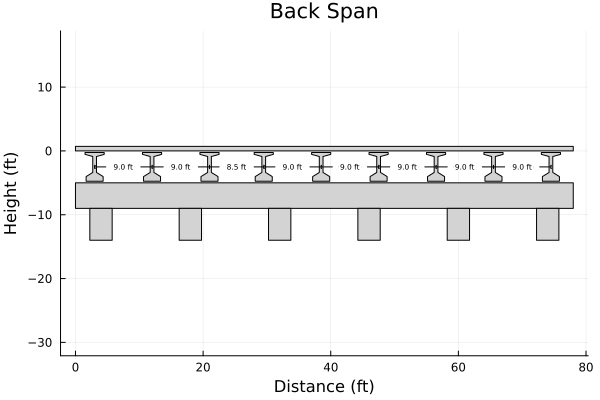

In [76]:
#| label: fig-bkspan
#| fig-cap: Section View of Back Span

plot(bk, title="Back Span", xlabel="Distance", ylabel="Height")
plot!(cap, y_offset=-5ft)

{{< pagebreak >}}

## Forward Span

The figure below shows the beam spacing for the forwardspan girders.

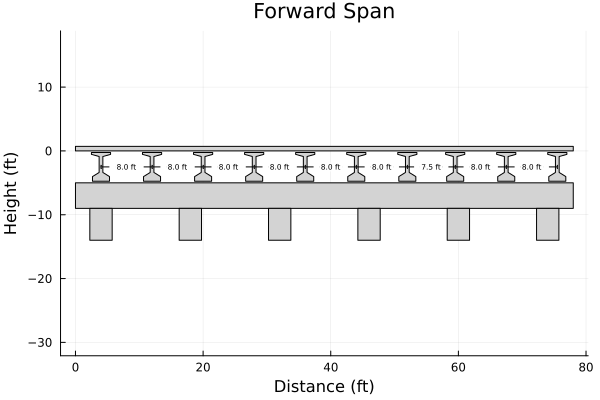

In [77]:
#| label: fig-fdspan
#| fig-cap: "Section View of Forward Span"

# plot forward span
plot(fd, title="Forward Span", xlabel="Distance", ylabel="Height")
plot!(cap, y_offset=-5ft)

{{< pagebreak >}}

# Cap 18

A Cap18 input file was created and ran for the above bent. The output file was then parsed for the dead load, working stress, and load factor cases. The summary of the findings are discussed below.

In [78]:
# File Info
path = pwd() * "\\cap18_ex2.lis";
p = parse_cap18(path);

# parse dead load ws results
p1_tb4a = DataFrame(p[1].tb4a.results)
d_dc_cap18 = deflections(p[1].tb4a)
m_dc_cap18 = moments(p[1].tb4a) |> trim
s_dc_cap18 = shears(p[1].tb4a) |> trim

# parse ws results
p1_tb6 = DataFrame(p[1].tb6ws.results)
smax_cap18_srv = max_shears(p[1].tb6ws) |> trim
smin_cap18_srv = min_shears(p[1].tb6ws) |> trim
se_cap18_srv = shear_envelopes(p[1].tb6ws) |> trim

mmax_cap18_srv = max_moments(p[1].tb6ws) |> trim
mmin_cap18_srv = min_moments(p[1].tb6ws) |> trim
me_cap18_srv = moment_envelopes(p[1].tb6ws) |> trim
r_cap18_srv = DataFrame(p[1].tb7ws.results)

# parse lf results
p1_tb6lf = DataFrame(p[1].tb6lf.results)
smax_cap18_str = max_shears(p[1].tb6lf) |> trim
smin_cap18_str = min_shears(p[1].tb6lf) |> trim
se_cap18_str = shear_envelopes(p[1].tb6lf) |> trim

mmax_cap18_str = max_moments(p[1].tb6lf) |> trim
mmin_cap18_str = min_moments(p[1].tb6lf) |> trim
me_cap18_str = moment_envelopes(p[1].tb6lf) |> trim
r_cap18_str = DataFrame(p[1].tb7lf.results);

## SRV

### Dead Load Results (SRV)

The dead load results were plotted on top of the bent to get a better visual understanding of the results. Based on the DL shear and moment diagrams below, the Cap18 results look to align well with the bent. Sharp changes in shear happen in areas with either a column or a beam, and negative moments are maximized over the columns. This indicates to some degree that the expected behavior of the stresses within the cap is being captured by the Cap18 program. A more detailed comparison with Larsa results will help determine if the magnitudes of these stresses are correct.

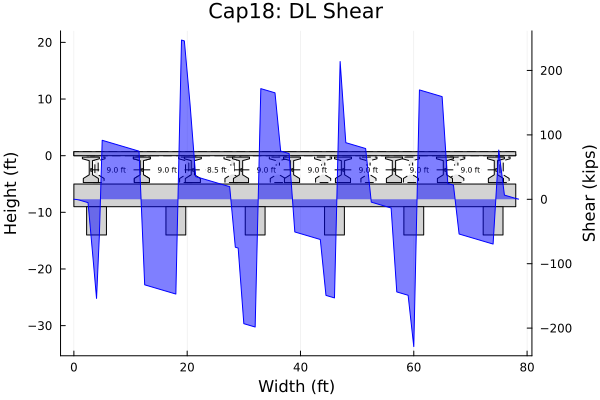

In [79]:
#| label: fig-c18-dl-shear
#| fig-cap: "Cap18: DL Shear Diagram"

plot_stress(s_dc_cap18, title = "Cap18: DL Shear", ylabel="Shear (kips)")

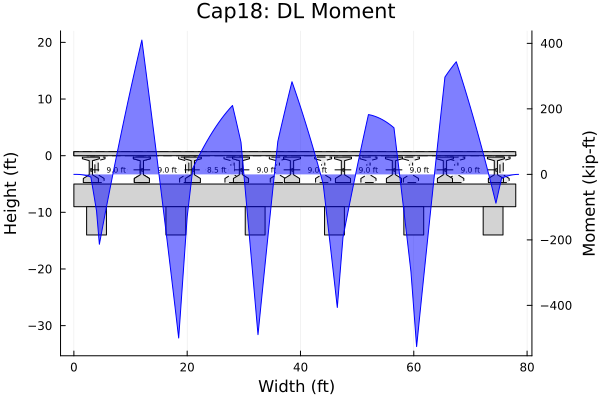

In [80]:
#| label: fig-c18-dl-moment
#| fig-cap: "Cap18: DL Moment Diagram"

plot_stress(m_dc_cap18, title = "Cap18: DL Moment", ylabel="Moment (kip-ft)")

{{< pagebreak >}}

### Envelopes of Maximum Values (SRV)

The working stress results were plotted on top of the bent to get a better visual understanding of the results. The results can be seen in the figures below. These stresses follow the same expected behavoir as the DL stresses. Further comparison with Larsa is needed.

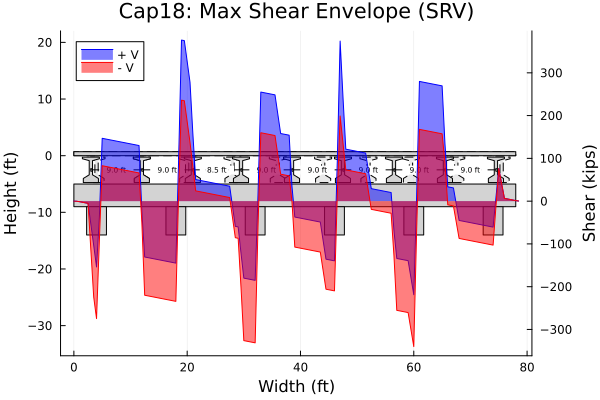

In [81]:
#| label: fig-c18-ws-shear
#| fig-cap: "Cap18: Service Shear Envelope Diagram"

plot_stress(se_cap18_srv, title = "Cap18: Max Shear Envelope (SRV)", ylabel="Shear (kips)")

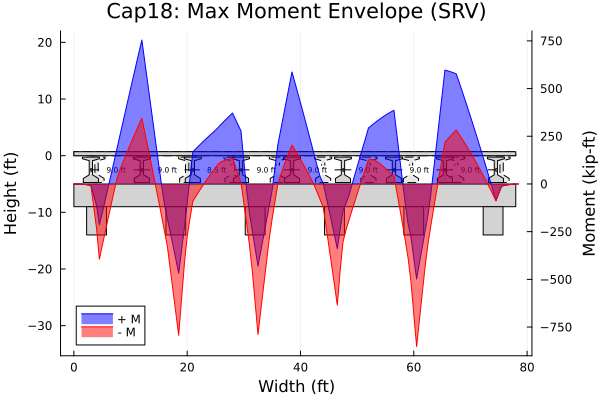

In [82]:
#| label: fig-c18-ws-moment
#| fig-cap: "Cap18: Service Moment Envelope Diagram"

plot_stress(me_cap18_srv, title = "Cap18: Max Moment Envelope (SRV)", ylabel="Moment (kip-ft)")

### Maximum Support Reactions (SRV)

The maximum and minimum support reactions for the working stress case are listed in the table below.

In [83]:
#| tbl-cap: "Cap18: Service Reactions"
#| tbl-pos: H

print_reactions(r_cap18_srv)

Station,Distance,Max Reactions,Min Reactions
9,4.5 ft,465.3 kip,288.4 kip
37,18.5 ft,613.5 kip,383.5 kip
65,32.5 ft,587.7 kip,347.7 kip
93,46.5 ft,585.6 kip,341.3 kip
121,60.5 ft,622.6 kip,389.2 kip
149,74.5 ft,427.3 kip,267.5 kip


{{< pagebreak >}}

## STR

### Envelopes of Maximum Values (STR)

The load factor results were plotted on top of the bent to get a better visual understanding of the results. The results can be seen in the figures below. These stresses follow the same expected behavoir as the DL stresses. Further comparison with Larsa is needed.

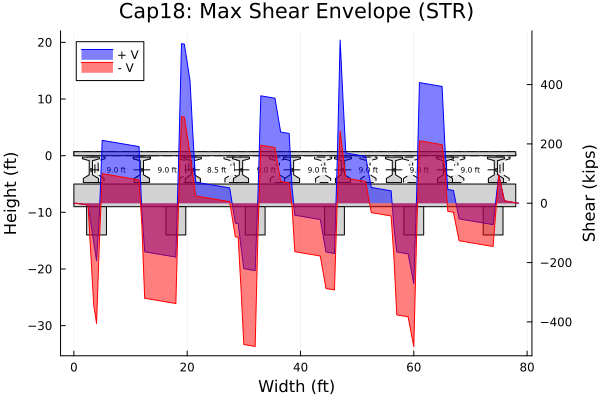

In [84]:
#| label: fig-c18-lf-shear
#| fig-cap: "Cap18: Strength Shear Envelope Diagram"

plot_stress(se_cap18_str, title = "Cap18: Max Shear Envelope (STR)", ylabel="Shear (kips)")

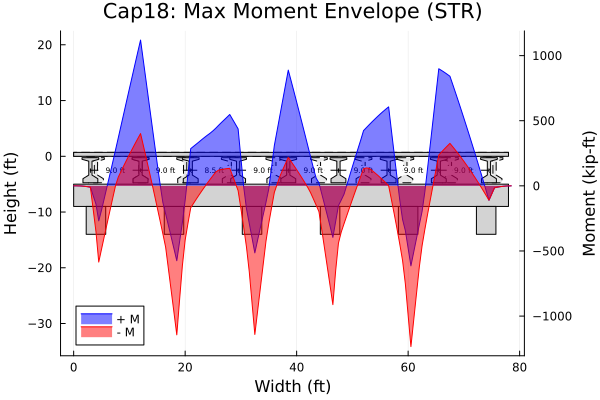

In [85]:
#| label: fig-c18-lf-moment
#| fig-cap: "Cap18: Strength Moment Envelope Diagram"

plot_stress(me_cap18_str, title = "Cap18: Max Moment Envelope (STR)", ylabel="Moment (kip-ft)")

### Maximum Support Reactions (STR)

The maximum and minimum support reactions for the load factor case are listed in the table below.

In [86]:
#| tbl-cap: "Cap18: Strength Reactions"
#| tbl-pos: H

print_reactions(r_cap18_str)

Station,Distance,Max Reactions,Min Reactions
9,4.5 ft,668.3 kip,358.8 kip
37,18.5 ft,879.4 kip,476.8 kip
65,32.5 ft,846.0 kip,426.0 kip
93,46.5 ft,843.7 kip,416.3 kip
121,60.5 ft,893.2 kip,484.7 kip
149,74.5 ft,612.1 kip,332.4 kip


{{< pagebreak >}}

# Larsa Results

A Larsa model was created and ran for the above bent. The loads were extracted for the dead load, working stress, and load factor cases. The summary of the findings are discussed below.

In [87]:
# File Info"
path_dc_larsa_srv = dir *"\\dc_larsa_srv.csv"
path_se_larsa_srv = dir *"\\se_larsa_srv.csv"
path_me_larsa_srv = dir *"\\me_larsa_srv.csv"
path_se_larsa_str = dir *"\\se_larsa_str.csv"
path_me_larsa_str = dir *"\\me_larsa_str.csv"
path_r_larsa_srv = dir *"\\r_larsa_srv.csv"
path_r_larsa_str = dir *"\\r_larsa_str.csv"

# parse dead load
df_dc_larsa_srv = dropmissing(CSV.read(path_dc_larsa_srv, DataFrame))
m_dc_larsa = parse_larsa_moments(df_dc_larsa_srv, :maximum)
s_dc_larsa = parse_larsa_shears(df_dc_larsa_srv, :maximum)

# parse ws loads
df_se_larsa_srv = dropmissing(CSV.read(path_se_larsa_srv, DataFrame))
df_me_larsa_srv = dropmissing(CSV.read(path_me_larsa_srv, DataFrame))
#shears
smax_larsa_srv = parse_larsa_shears(df_se_larsa_srv, :maximum)
smin_larsa_srv = parse_larsa_shears(df_se_larsa_srv, :minimum)
se_larsa_srv = parse_larsa_shears(df_se_larsa_srv)
# moments
mmax_larsa_srv = parse_larsa_moments(df_me_larsa_srv, :maximum)
mmin_larsa_srv = parse_larsa_moments(df_me_larsa_srv, :minimum)
me_larsa_srv = parse_larsa_moments(df_me_larsa_srv)
#reactions
r_larsa_srv = parse_larsa_reactions(path_r_larsa_srv)

# parse lf loads
df_se_larsa_str = dropmissing(CSV.read(path_se_larsa_str, DataFrame))
df_me_larsa_str = dropmissing(CSV.read(path_me_larsa_str, DataFrame))
#shears
smax_larsa_str = parse_larsa_shears(df_se_larsa_str, :maximum)
smin_larsa_str = parse_larsa_shears(df_se_larsa_str, :minimum)
se_larsa_str = parse_larsa_shears(df_se_larsa_str)
# moments
mmax_larsa_str = parse_larsa_moments(df_me_larsa_str, :maximum)
mmin_larsa_str = parse_larsa_moments(df_me_larsa_str, :minimum)
me_larsa_str = parse_larsa_moments(df_me_larsa_str)
#reactions
r_larsa_str = parse_larsa_reactions(path_r_larsa_str);

## SRV

### Dead Load Results (SRV)

The dead load results were plotted on top of the bent to get a better visual understanding of the results. Based on the DL shear and moment diagrams below, the Larsa results look to align well with the bent. A more detailed comparison with the Cap18 results will help determine if the magnitudes of the stresses calculated from the Cap18 program are correct.

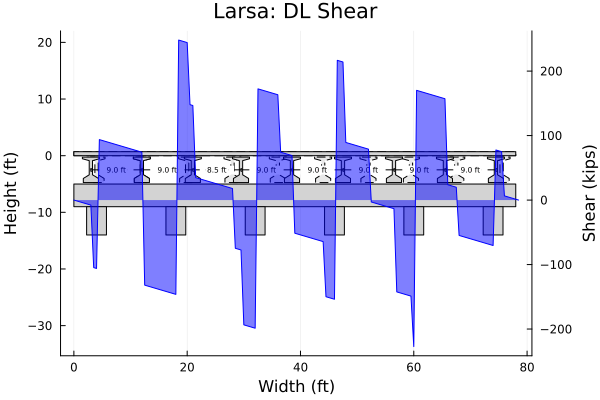

In [88]:
#| label: fig-larsa-dl-shear
#| fig-cap: "LARSA: DL Shear Diagram"

plot_stress(s_dc_larsa, title = "Larsa: DL Shear", ylabel="Shear (kips)")

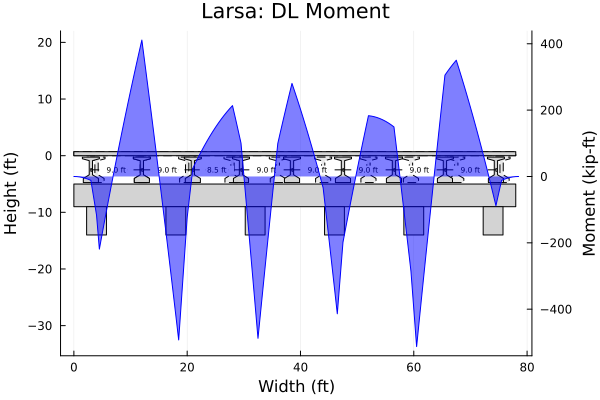

In [89]:
#| label: fig-larsa-dl-moment
#| fig-cap: "LARSA: DL Moment Diagram"

plot_stress(m_dc_larsa, title = "Larsa: DL Moment", ylabel="Moment (kip-ft)")

{{< pagebreak >}}

### Envelopes of Maximum Values (SRV)
The working stress results were plotted on top of the bent to get a better visual understanding of the results. The results can be seen in the figures below. These stresses follow the same expected behavoir as the DL stresses. Further comparison with Cap18 is needed.

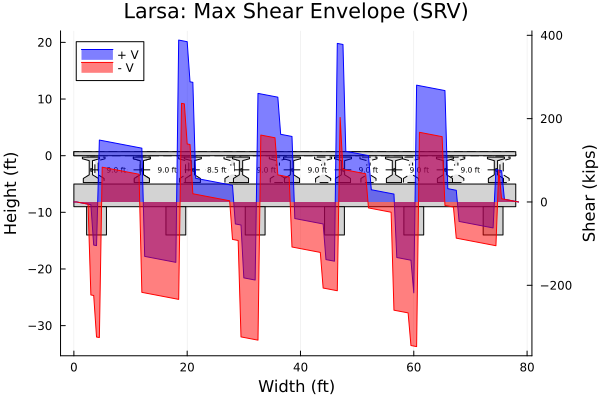

In [90]:
#| label: fig-larsa-ws-shear
#| fig-cap: "LARSA: Service Shear Envelope Diagram"

plot_stress(se_larsa_srv, title = "Larsa: Max Shear Envelope (SRV)", ylabel="Shear (kips)")

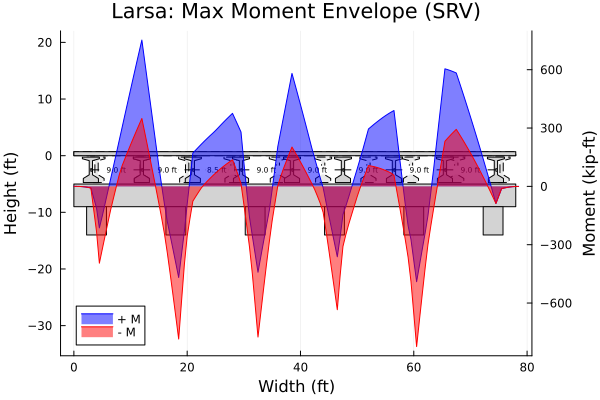

In [91]:
#| label: fig-larsa-ws-moment
#| fig-cap: "LARSA: Service Moment Envelope Diagram"

plot_stress(me_larsa_srv, title = "Larsa: Max Moment Envelope (SRV)", ylabel="Moment (kip-ft)")

### Maximum Support Reactions (SRV)

The maximum and minimum support reactions for the working stress case are listed in the table below.


In [92]:
#| tbl-cap: "LARSA: Service Reactions"
#| tbl-pos: H

print_reactions(r_larsa_srv)

Station,Distance,Max Reactions,Min Reactions
9,4.5 ft,465.86 kip,289.142 kip
37,18.5 ft,616.513 kip,384.262 kip
65,32.5 ft,585.038 kip,350.561 kip
93,46.5 ft,586.099 kip,347.547 kip
121,60.5 ft,617.082 kip,387.892 kip
149,74.5 ft,437.109 kip,269.025 kip


{{< pagebreak >}}

## STR

### Envelopes of Maximum Values (STR)

The load factor results were plotted on top of the bent to get a better visual understanding of the results. The results can be seen in the figures below. These stresses follow the same expected behavoir as the DL stresses. Further comparison with Cap18 is needed.

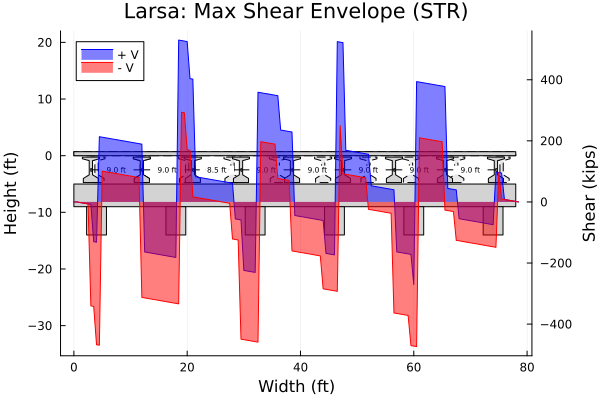

In [93]:
#| label: fig-larsa-lf-shear
#| fig-cap: "LARSA: Strength Shear Envelope Diagram"

plot_stress(se_larsa_str, title = "Larsa: Max Shear Envelope (STR)", ylabel="Shear (kips)")

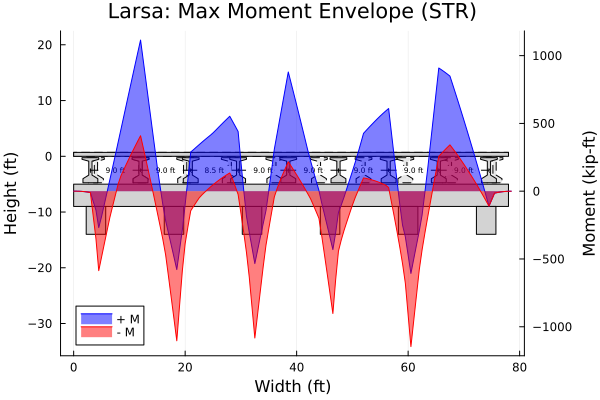

In [94]:
#| label: fig-larsa-lf-moment
#| fig-cap: "LARSA: Strength Moment Envelope Diagram"

plot_stress(me_larsa_str, title = "Larsa: Max Moment Envelope (STR)", ylabel="Moment (kip-ft)")

### Maximum Support Reactions (STR)
The maximum and minimum support reactions for the load factor case are listed in the table below.

In [95]:
#| tbl-cap: "LARSA: Strength Reactions"
#| tbl-pos: H

print_reactions(r_larsa_str)

Station,Distance,Max Reactions,Min Reactions
9,4.5 ft,669.094 kip,359.836 kip
37,18.5 ft,848.741 kip,478.514 kip
65,32.5 ft,809.339 kip,431.215 kip
93,46.5 ft,807.774 kip,426.186 kip
121,60.5 ft,852.34 kip,483.67 kip
149,74.5 ft,628.815 kip,334.667 kip


{{< pagebreak >}}

# Comparison

Below is a comparison of the Cap18 and Larsa results. Stresses were found to be fairly similar between the different programs. The main differences are in the shear stresses. Cap18 seems to have a more gradual change in shear compared to Larsa. This is most likely due to the way Cap18 defines the point loads in the program. This gradual vs more sharp change in shear does not seem to affect the moment diagram in a significant way. Moment diagram stresses do show some differences and will be discussed in more detail below.

**Important Plot Information**\
The comparison plots for the shear and moment diagrams are shown below for all the different load cases. The Cap18 results are shown in a blue line and the larsa results are shown in a red line. The red line will only really be visible when the larsa results are greater in magnitude than the cap18 results. The thickness of the red or blue line shows how much greater in magnitdue the respective result was. The absolute difference between larsa and cap18 is show in yellow. Any positive yellow results indicate that larsa was greater in magnitude. Data labels are also visible for the moment diagrams at the local extrema. Text in blue indicates that Cap18 was greater in magnitude, while red text indicates larsa results were greater in magnitude.

{{< pagebreak >}}

## SRV

### Dead Load Results (SRV)

The figures below compare the DL results between the two programs. The areas in red highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. The maximum values are shown to be very similar. In areas of maximum moment and shears, the results are within 3%.


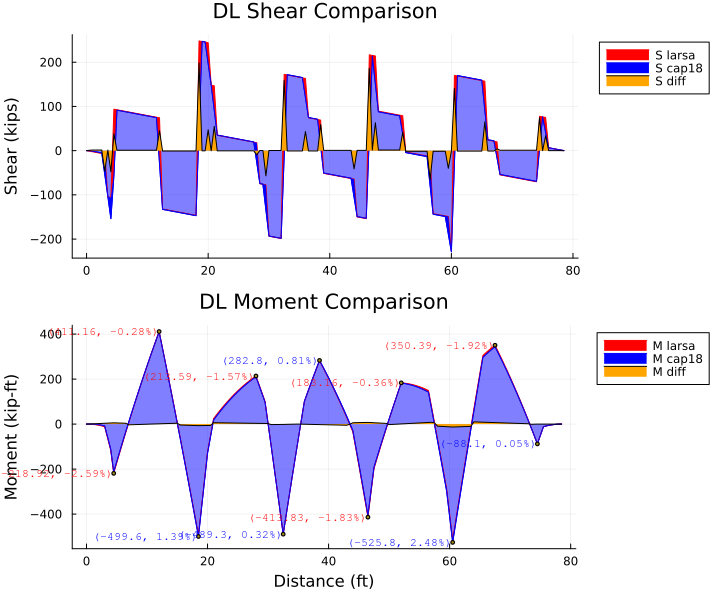

In [96]:
#| label: fig-comp-dl
#| fig-cap: "Comparison: DL Shear and Moment Diagrams"

plot_comparison(
	s_dc_cap18, s_dc_larsa, m_dc_cap18, m_dc_larsa; 
	legend_pos=legend_pos, 
	size = (x_size, y_size),
	shear_alpha=0.5,
	moment_alpha=0.5,
	shear_title="DL Shear Comparison",
	moment_title="DL Moment Comparison",
	base_color=:blue
)

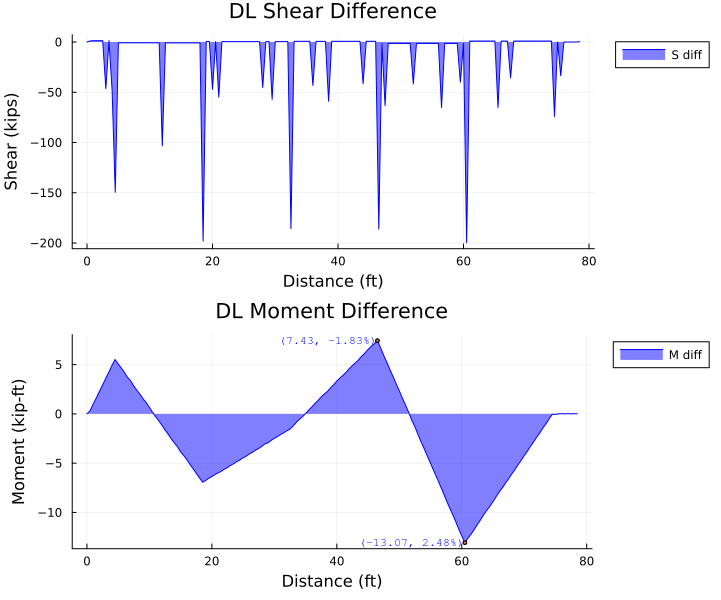

In [97]:
#| label: fig-comp-dl-diff
#| fig-cap: "Comparison: DL Shear and Moment Difference"

plot_difference(
	s_dc_cap18, s_dc_larsa, m_dc_cap18, m_dc_larsa,
	shear_title= "DL Shear Difference",
	moment_title= "DL Moment Difference",
	fillcolor=:blue
)

{{< pagebreak >}}

### Envelopes of Maximum Values (SRV)

#### Maximum Envelope Comparison

The figures below compare the working stress results for the maximum stress envelope between the two programs. The areas in red highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. The maximum values are shown to be very similar. In areas of maximum moment and shears, the results are within 3%.


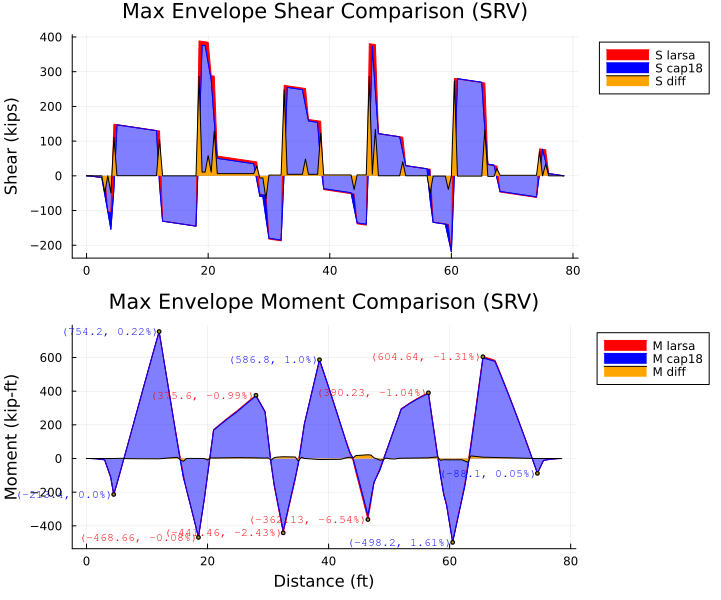

In [98]:
#| label: fig-comp-ws-max
#| fig-cap: "Comparison: Service Shear and Moment Max Envelope Diagrams"

plot_max_comparison(se_cap18_srv, se_larsa_srv, me_cap18_srv, me_larsa_srv, 
	legend_pos=legend_pos, 
	size=(x_size, y_size),
	base_color=:blue,
	shear_title="Max Envelope Shear Comparison (SRV)",
	moment_title="Max Envelope Moment Comparison (SRV)",
)

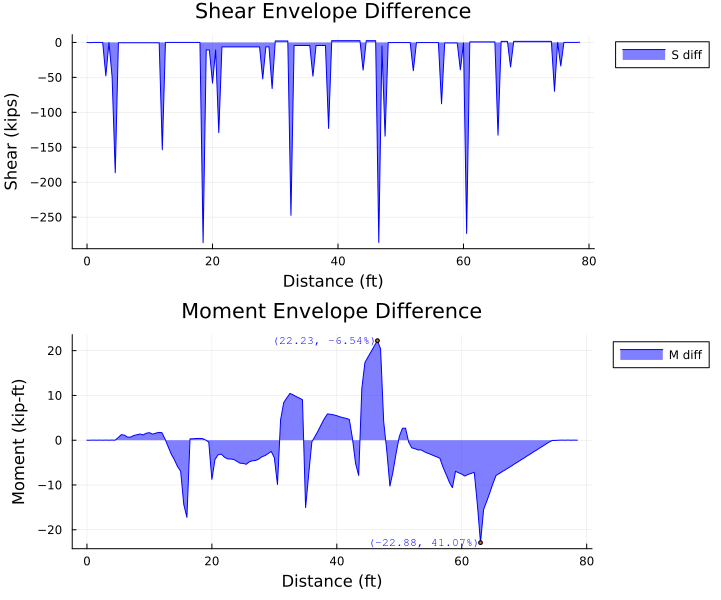

In [99]:
#| label: fig-comp-ws-max-diff
#| fig-cap: "Comparison: Service Shear and Moment Max Envelope Difference"

plot_difference(
	max_shears(se_cap18_srv), max_shears(se_larsa_srv), max_moments(me_cap18_srv), max_moments(me_larsa_srv),
	shear_title= "Shear Envelope Difference",
	moment_title= "Moment Envelope Difference",
)

{{< pagebreak >}}

#### Minimum Envelope Comparison

The figures below compare the working stress results for the minimum stress envelope between the two programs. The areas in red (not the light red areas) highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. . In areas of maximum moment and shears, the results are within 4%.


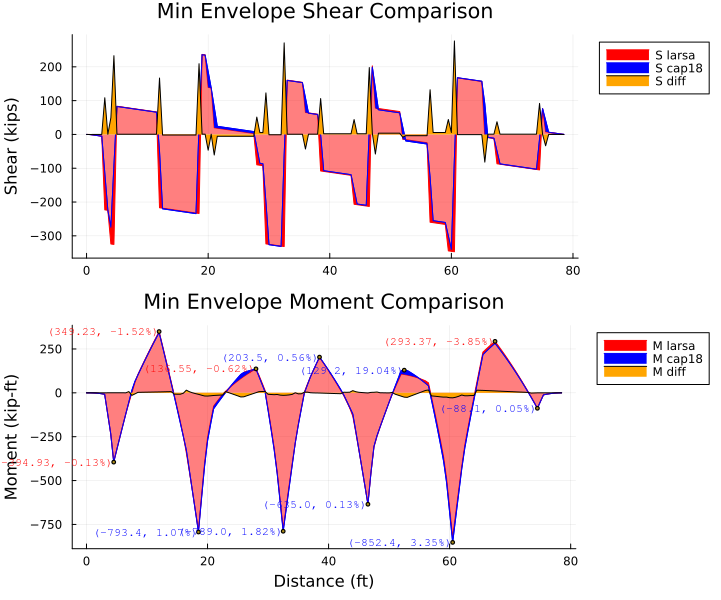

In [100]:
#| label: fig-comp-ws-min
#| fig-cap: "Comparison: Service Shear and Moment Min Envelope Diagrams"

plot_min_comparison(se_cap18_srv, se_larsa_srv, me_cap18_srv, me_larsa_srv, 
	legend_pos=legend_pos, 
	size=(x_size, y_size),
	base_color=:red,
	shear_title="Min Envelope Shear Comparison",
	moment_title="Min Envelope Moment Comparison",
)

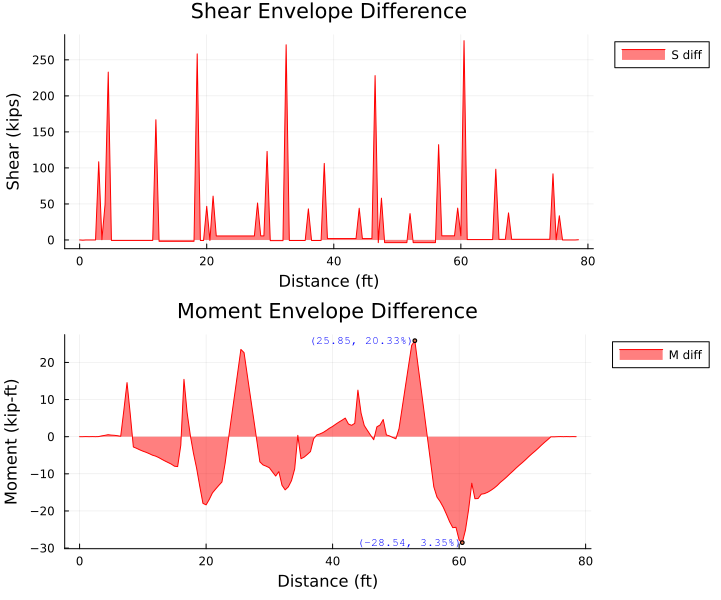

In [101]:
#| label: fig-comp-ws-min-diff
#| fig-cap: "Comparison: Service Shear and Moment Min Envelope Difference"

plot_difference(
	min_shears(se_cap18_srv), min_shears(se_larsa_srv), min_moments(me_cap18_srv), min_moments(me_larsa_srv),
	shear_title= "Shear Envelope Difference",
	moment_title= "Moment Envelope Difference",
	fillcolor=:red
)

{{< pagebreak >}}

### Live Load Comparison (SRV)

The figures below compare the working stress results for the maximum stress envelope of the live load between the two programs. The areas in red highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, some of the differences can be explained by the difference in point load modeling between the two programs. The other shear areas where larsa results look to be higher in magnitude could potentially be explained by the difference in how the programs run the live load. The Larsa modeling of the live load is a little limited and conservative methods were used. 

The maximum moment values are shown to be very similar. In areas of maximum moment, the results are within 3%.


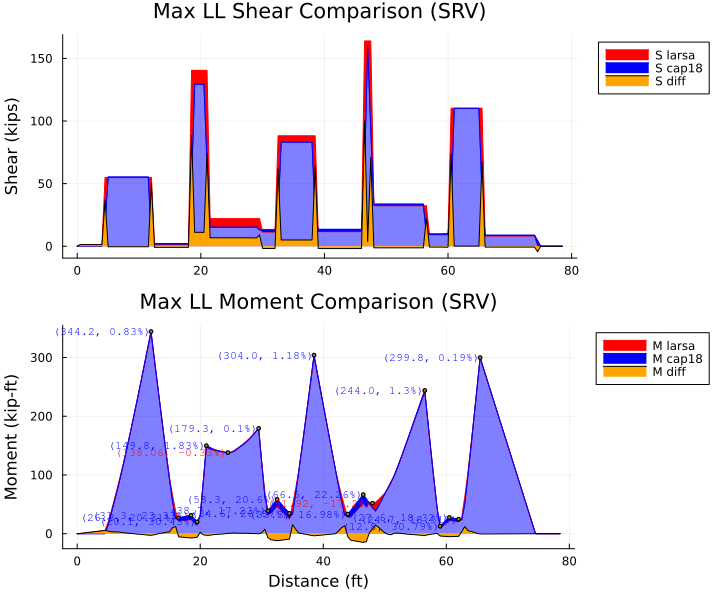

In [102]:
#| label: fig-comp-ws-max-ll
#| fig-cap: "Comparison: Service Shear and Moment Max LL Envelope Diagrams"

plot_max_ll_comparison(
	se_cap18_srv, se_larsa_srv, 
	me_cap18_srv, me_larsa_srv, 
	s_dc_cap18, s_dc_larsa,
	m_dc_cap18, m_dc_larsa; 
	shear_title="Max LL Shear Comparison (SRV)",
	moment_title="Max LL Moment Comparison (SRV)",
	base_color=:blue
)

{{< pagebreak >}}

The figures below compare the working stress results for the minimum stress envelope of the live load between the two programs. The areas in red (not the light red areas) highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. There are also large red spikes in the shear diagram for the larsa results. This is also a sign there are some unrealistic modeling behaviors in the larsa model.

The maximum moment values are shown to be very similar. In areas of maximum moment, the results are within 5%.


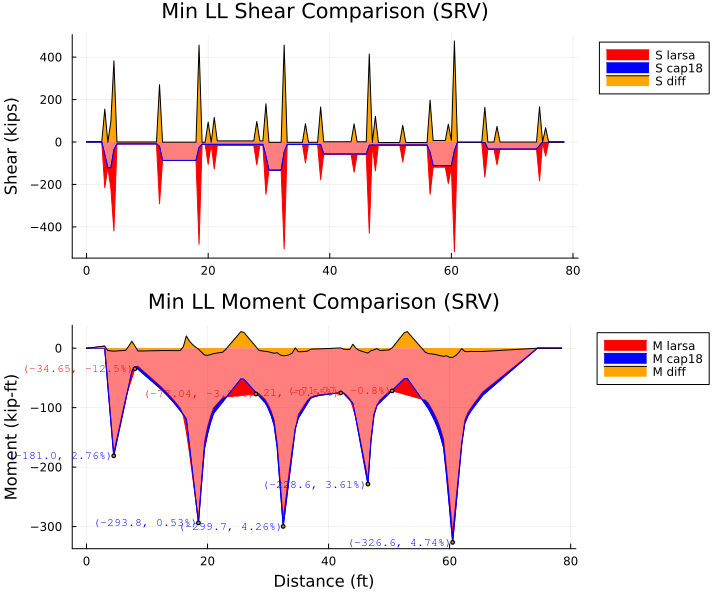

In [103]:
#| label: fig-comp-ws-min-ll
#| fig-cap: "Comparison: Service Shear and Moment Min LL Envelope Diagrams"

plot_min_ll_comparison(
	se_cap18_srv, se_larsa_srv, 
	me_cap18_srv, me_larsa_srv, 
	s_dc_cap18, s_dc_larsa,
	m_dc_cap18, m_dc_larsa; 
	shear_title="Min LL Shear Comparison (SRV)",
	moment_title="Min LL Moment Comparison (SRV)",
	base_color=:red
)

{{< pagebreak >}}

### Maximum Support Reactions (SRV)

The figure below compares the working stress results for the maximum and minimum reactions between the two programs. The results between programs are within 2% of eachother.


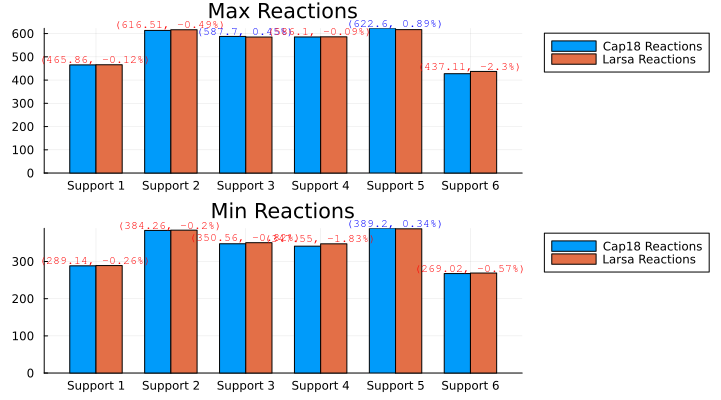

In [112]:
#| label: fig-comp-ws-reactions
#| fig-cap: "Comparison: Service Reactions"

num_supports = length(r_cap18_srv.max_reaction)
ctg = repeat(["Cap18 Reactions", "Larsa Reactions"], inner = num_supports)
nam = repeat("Support " .* string.(1:num_supports), outer = 2)
plt1 = stats.groupedbar(nam, hcat(r_cap18_srv.max_reaction, r_larsa_srv.max_reaction), 
	bar_position = :dodge, bar_width=0.7, group=ctg, title = title="Max Reactions",
		)
plt2 = stats.groupedbar(nam, hcat(r_cap18_srv.min_reaction, r_larsa_srv.min_reaction), 
	bar_position = :dodge, bar_width=0.7, group=ctg, title="Min Reactions",
		)

	plot(plt1, plt2, layout=(2, 1), legend=legend_pos, size=(x_size, 400))
	plot_reaction_labels(r_cap18_srv, r_larsa_srv; subplot=1, text_pos=:bottom, text_size=6)

{{< pagebreak >}}

## STR

### Envelopes of Maximum Values (STR)

The figures below compare the load factor results for the maximum stress envelope between the two programs. The areas in red highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. The maximum values are shown to be very similar. In areas of maximum moment, the results are within 3%.


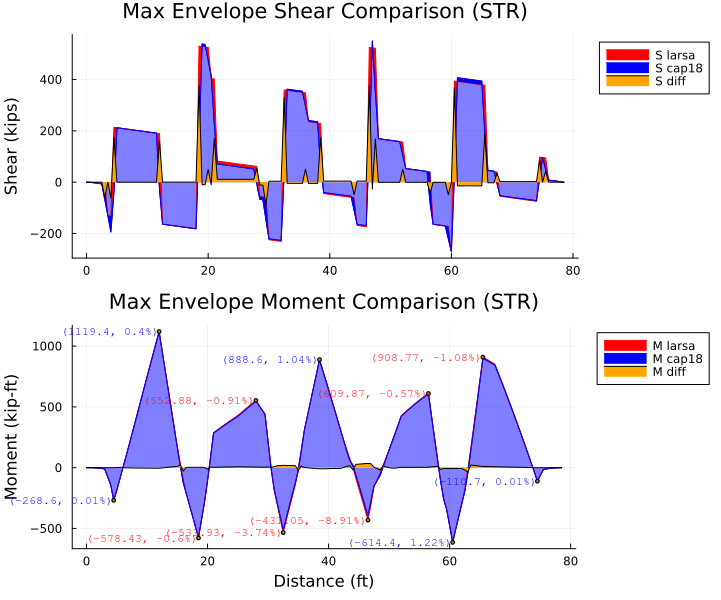

In [105]:
#| label: fig-comp-lf-max
#| fig-cap: "Comparison: Strength Shear and Moment Max Envelope Diagrams"

plot_max_comparison(se_cap18_str, se_larsa_str, me_cap18_str, me_larsa_str, 
	legend_pos=legend_pos, 
	size=(x_size, y_size),
	base_color=:blue,
	shear_title="Max Envelope Shear Comparison (STR)",
	moment_title="Max Envelope Moment Comparison (STR)",
)

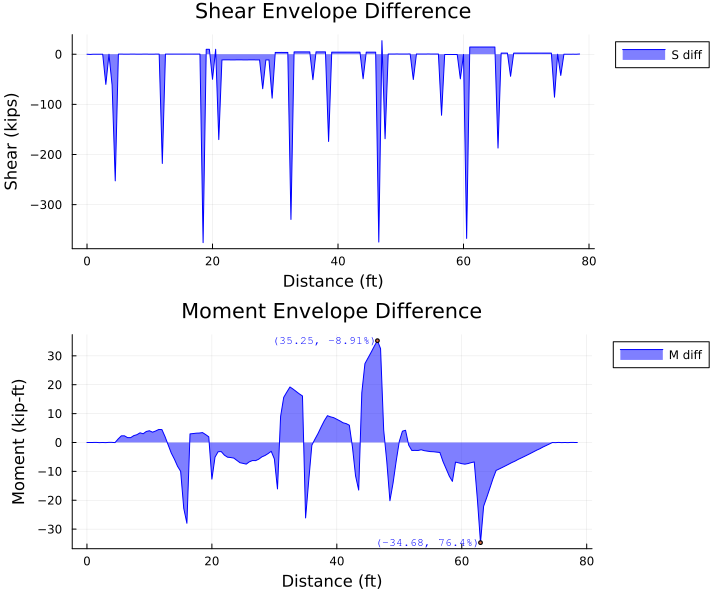

In [106]:
#| label: fig-comp-lf-max-diff
#| fig-cap: "Comparison: Strength Shear and Moment Max Envelope Difference"

plot_difference(
	max_shears(se_cap18_str), max_shears(se_larsa_str), max_moments(me_cap18_str), max_moments(me_larsa_str),
	shear_title= "Shear Envelope Difference",
	moment_title= "Moment Envelope Difference",
)

{{< pagebreak >}}

The figures below compare the load factor results for the minimum stress envelope between the two programs. The areas in red (not the light red areas) highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. . In areas of maximum moment and shears, the results are within 8%. Areas where larsa results are greater than cap18 are within 5% (these areas are also positive moments when negative moment are being maximized).


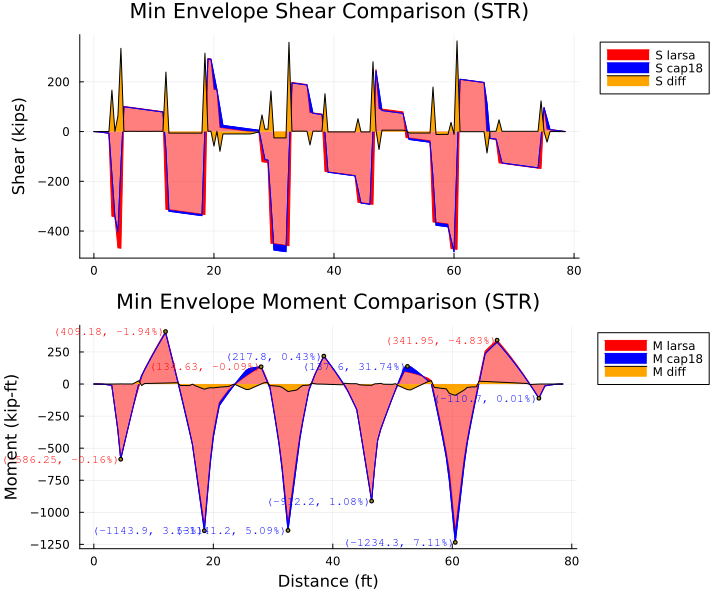

In [107]:
#| label: fig-comp-lf-min
#| fig-cap: "Comparison: Strength Shear and Moment Min LL Envelope Diagrams"

plot_min_comparison(se_cap18_str, se_larsa_str, me_cap18_str, me_larsa_str, 
	legend_pos=legend_pos, 
	size=(x_size, y_size),
	base_color=:red,
	shear_title="Min Envelope Shear Comparison (STR)",
	moment_title="Min Envelope Moment Comparison (STR)",
)

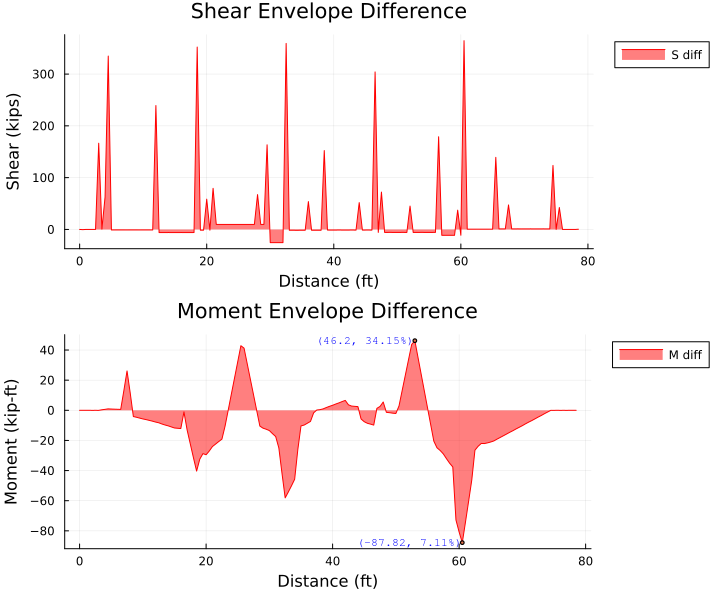

In [108]:
#| label: fig-comp-lf-min-diff
#| fig-cap: "Comparison: Strength Shear and Moment Min Envelope Difference"

plot_difference(
	min_shears(se_cap18_str), min_shears(se_larsa_str), min_moments(me_cap18_str), min_moments(me_larsa_str),
	shear_title= "Shear Envelope Difference",
	moment_title= "Moment Envelope Difference",
	fillcolor=:red
)

{{< pagebreak >}}

### Live Load Comparison (STR)

The figures below compare the load factor results for the maximum stress envelope of the live load between the two programs. The areas in red highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. The maximum values are shown to be very similar. In areas of maximum moment, the results are within 3% (when looking at the positive moments).


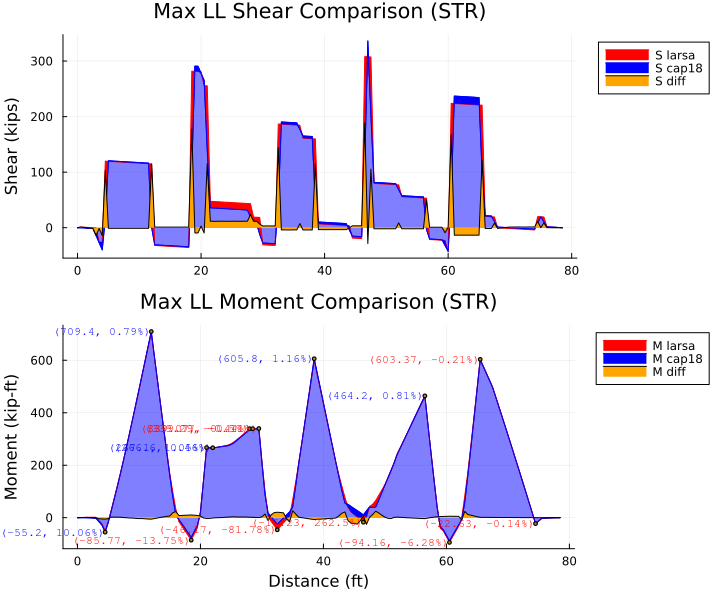

In [109]:
#| label: fig-comp-lf-max-ll
#| fig-cap: "Comparison: Strength Shear and Moment Max LL Envelope Diagrams"

max_ll_m_cap18_srv = max_moments(me_cap18_srv) - m_dc_cap18
min_ll_m_cap18_srv = min_moments(me_cap18_srv) - m_dc_cap18
max_ll_m_larsa_srv = max_moments(me_larsa_srv) - m_dc_larsa
min_ll_m_larsa_srv = min_moments(me_larsa_srv) - m_dc_larsa
		
plot_max_ll_comparison(
	se_cap18_str, se_larsa_str, 
	me_cap18_str, me_larsa_str, 
	s_dc_cap18, s_dc_larsa,
	m_dc_cap18, m_dc_larsa; 
	shear_title="Max LL Shear Comparison (STR)",
	moment_title="Max LL Moment Comparison (STR)",
	base_color=:blue
)

{{< pagebreak >}}

The figures below compare the load factor results for the minimum stress envelope of the live load between the two programs. The areas in red (not the light red areas) highlight where larsa results were greater in magnitude than the cap18 results. There are some visible red areas in the shear diagram. However, these can be explained by the difference in point load modeling between the two programs. There are also large red spikes in the shear diagram for the larsa results. This is also a sign there are some unrealistic modeling behaviors in the larsa model.

The maximum moment values are shown to be very similar. In areas of maximum moment, the results are greater at 11%. However, with the limitations of the larsa model, this is not alarming. Cap18 results are higher and the program is doing a better job at maximizing the controlling areas.

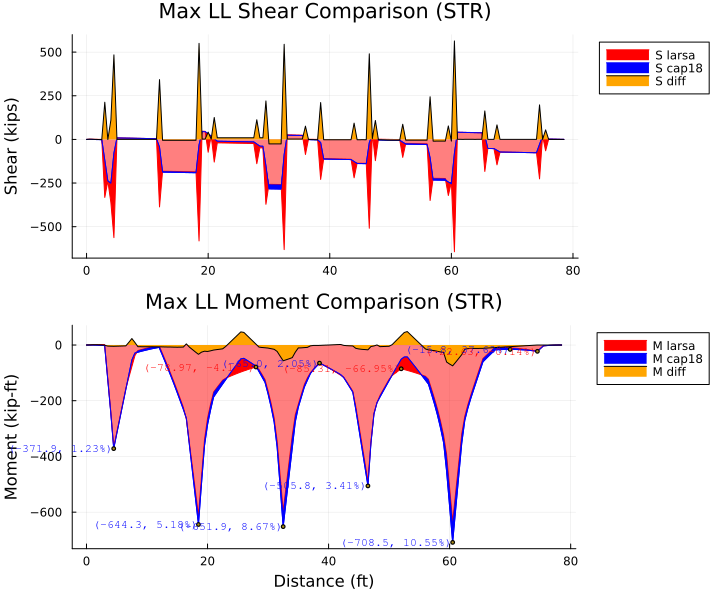

In [110]:
#| label: fig-comp-lf-min-ll
#| fig-cap: "Comparison: Strength Shear and Moment Min LL Envelope Diagrams"

plot_min_ll_comparison(
	    se_cap18_str, se_larsa_str, 
	    me_cap18_str, me_larsa_str, 
	    s_dc_cap18, s_dc_larsa,
	    m_dc_cap18, m_dc_larsa; 
	    shear_title="Max LL Shear Comparison (STR)",
		moment_title="Max LL Moment Comparison (STR)",
		base_color=:red
)

{{< pagebreak >}}

### Maximum Support Reactions (STR)

The figure below compares the load factor results for the maximum and minimum reactions between the two programs. The results between programs are within 5% of eachother.


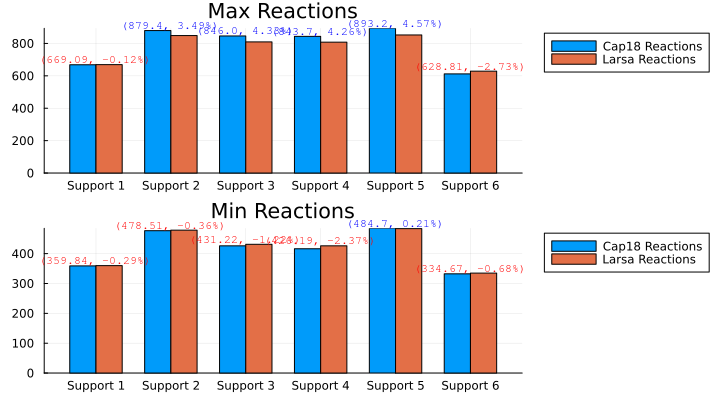

In [111]:
#| label: fig-comp-lf-reactions
#| fig-cap: "Comparison: Strength Reactions"

num_supports = length(r_cap18_str.max_reaction)
ctg = repeat(["Cap18 Reactions", "Larsa Reactions"], inner = num_supports)
nam = repeat("Support " .* string.(1:num_supports), outer = 2)
plt1 = stats.groupedbar(nam, hcat(r_cap18_str.max_reaction, r_larsa_str.max_reaction), 
	bar_position = :dodge, bar_width=0.7, group=ctg, title = title="Max Reactions",
		)
plt2 = stats.groupedbar(nam, hcat(r_cap18_str.min_reaction, r_larsa_str.min_reaction), 
	bar_position = :dodge, bar_width=0.7, group=ctg, title="Min Reactions",
		)

	plot(plt1, plt2, layout=(2, 1), legend=legend_pos, size=(x_size, 400))
	plot_reaction_labels(r_cap18_str, r_larsa_str; subplot=1, text_pos=:bottom, text_size=6)